# IMPORTS

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
import cv2
import pandas as pd
from skimage.color import rgb2gray
from PIL import Image
from sklearn.cluster import KMeans

# READ, DISPLAY IMAGE

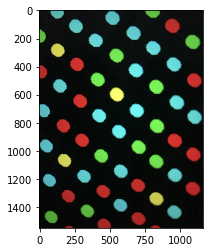

In [2]:
img_path = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/ccp2.png'
img = plt.imread(img_path)[:,:,:3]
plt.imshow(img)
plt.show()

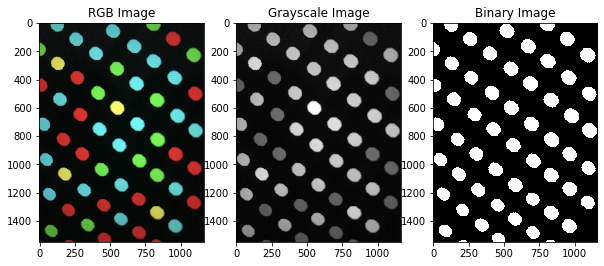

In [3]:
def read_display(img_path, th=50, img=None, show=True):
    """
    Input: 
          Image path (str)
    Output:
          Displays RGB, grayscale, and binary image
    Returns:
          RGB, grayscale, binary (n-d numpy arrays)
    
    """
    # read rgb image
    if img == None: 
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        pass
       
    # Convert to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Convert to binary
    img_bin = (img_gray > th).astype('uint8')
    
    if show == True:

        # display rgb, grayscale and binary image
        plt.figure(figsize=(10,20))
        plt.subplot(1,3,1)
        plt.imshow(img)
        plt.title('RGB Image')
        plt.subplot(1,3,2)
        plt.imshow(img_gray, cmap='gray')
        plt.title('Grayscale Image')
        plt.subplot(1,3,3)
        plt.imshow(img_bin, cmap='gray')
        plt.title('Binary Image')
        plt.show()
    
    return img, img_gray, img_bin

img, img_gray, img_bin = read_display(img_path)

# HELPER FUNCTIONS

In [4]:
def r_shift(s, i): 
    if i == 0:
        return s
    return s[-i:] + s[0:len(s)-i]  

def get_key(val, my_dict):  #extract key from dictionary with particular value
    for key, value in my_dict.items():
         if val == value:
            return key

# DEFINE & IDENTIFY RGB COLORS

In [5]:
red = np.array([255,0,0])
blue = np.array([0,255,255])
green = np.array([127,255,0])
yellow = np.array([255,255,0])
black = np.array([0,0,0])

colors_rgb = np.stack((red,yellow,green,blue,black))
color_dict_rgb = {0:'R',1:'Y',2:'G',3:'B',4:'Bl'}

def identify_color_rgb(rgb_val):
    c_list = []
    for i in colors_rgb:
        c_list.append(np.sum((i-rgb_val)**2))
    
    return color_dict_rgb[c_list.index(min(c_list))]

In [6]:
identify_color_rgb(img[400,250])

'R'

# CENTROIDS & COLORS 

In [7]:
def get_centroids(img, img_bin):
    """
    Input: 
          RGB 3-d numpy array, binary 2-d numpy array
    Output:
          None
    Returns:
          centroids of independent components (tuple) and their colors (char) 
          return type dict >> {centroids:'color'}
    """    
    num_labels, labels = cv2.connectedComponents(img_bin)
    centroids = {}
        
    for i in range(num_labels):
    
        # get x,y center coordinate of label
        x = np.int(np.mean(np.where(labels==i)[0]))
        y = np.int(np.mean(np.where(labels==i)[1]))
        
        # add pair {center:color} to dictionary circles 
        c = identify_color_rgb(img[x,y])
        if c != 'Bl':
            centroids[(x,y)] = c         
        
    return centroids

In [8]:
centroid_colors = get_centroids(img, img_bin)
centroid_colors

{(26, 129): 'B',
 (0, 383): 'R',
 (24, 806): 'G',
 (55, 520): 'B',
 (112, 944): 'R',
 (113, 261): 'B',
 (163, 670): 'B',
 (186, 20): 'G',
 (215, 401): 'B',
 (226, 1089): 'G',
 (268, 809): 'B',
 (284, 131): 'Y',
 (322, 549): 'G',
 (385, 955): 'B',
 (385, 269): 'R',
 (427, 686): 'B',
 (440, 24): 'R',
 (493, 415): 'G',
 (498, 1100): 'R',
 (538, 147): 'B',
 (544, 831): 'G',
 (599, 550): 'Y',
 (646, 291): 'R',
 (656, 976): 'B',
 (713, 692): 'B',
 (715, 35): 'B',
 (749, 426): 'B',
 (759, 1102): 'B',
 (823, 836): 'G',
 (821, 172): 'R',
 (863, 565): 'B',
 (924, 304): 'R',
 (926, 961): 'R',
 (964, 51): 'B',
 (973, 706): 'G',
 (1024, 1093): 'R',
 (1035, 440): 'G',
 (1067, 180): 'Y',
 (1075, 831): 'G',
 (1145, 579): 'B',
 (1172, 962): 'B',
 (1180, 318): 'B',
 (1209, 72): 'B',
 (1244, 701): 'R',
 (1267, 1090): 'R',
 (1287, 455): 'R',
 (1320, 208): 'R',
 (1340, 831): 'Y',
 (1385, 576): 'B',
 (1427, 342): 'G',
 (1434, 959): 'B',
 (1469, 86): 'G',
 (1480, 704): 'R',
 (1518, 460): 'R',
 (1540, 825): '

# CALCULATING NEAREST 8 CIRCLES

In [9]:
from heapq import nsmallest
def nearest_8(centroid_colors):
    """
    Input:
          type: dict
          {(centroids):'color'}
          centroids of independent components (tuple) and their colors (char)
    Output:
          None
    Returns:
          type: dict
          {(centroids): {nearest_8:distance}}
          centroids of independent components (tuple) and their nearest 8 neighbors with distances
    """ 
    my_list = {}
    points = list(centroid_colors.keys())
    for i in range(len(points)):
        lst = {}
        for j in range(len(points)):
            if i != j:
                x1,y1 = points[i]
                x2,y2 = points[j]
                sum_ = (x1-x2)**2 + (y1-y2)**2
                lst[points[j]] = sum_
        #print(lst)
        
        new_dict = {}
        vals = nsmallest(8,list(lst.values()))
        #print(vals)
        
        for key,val in lst.items():
            #print(val)
            if val in vals:
                new_dict[key] = centroid_colors[key]
        #print(new_lst)
        
        my_list[points[i]] = new_dict
    return my_list

k = nearest_8(centroid_colors)

In [10]:
k

{(26, 129): {(0, 383): 'R',
  (55, 520): 'B',
  (113, 261): 'B',
  (186, 20): 'G',
  (215, 401): 'B',
  (284, 131): 'Y',
  (385, 269): 'R',
  (440, 24): 'R'},
 (0, 383): {(26, 129): 'B',
  (55, 520): 'B',
  (113, 261): 'B',
  (163, 670): 'B',
  (215, 401): 'B',
  (284, 131): 'Y',
  (322, 549): 'G',
  (385, 269): 'R'},
 (24, 806): {(55, 520): 'B',
  (112, 944): 'R',
  (163, 670): 'B',
  (226, 1089): 'G',
  (268, 809): 'B',
  (322, 549): 'G',
  (385, 955): 'B',
  (427, 686): 'B'},
 (55, 520): {(26, 129): 'B',
  (0, 383): 'R',
  (24, 806): 'G',
  (113, 261): 'B',
  (163, 670): 'B',
  (215, 401): 'B',
  (268, 809): 'B',
  (322, 549): 'G'},
 (112, 944): {(24, 806): 'G',
  (55, 520): 'B',
  (163, 670): 'B',
  (226, 1089): 'G',
  (268, 809): 'B',
  (385, 955): 'B',
  (427, 686): 'B',
  (498, 1100): 'R'},
 (113, 261): {(26, 129): 'B',
  (0, 383): 'R',
  (55, 520): 'B',
  (186, 20): 'G',
  (215, 401): 'B',
  (284, 131): 'Y',
  (322, 549): 'G',
  (385, 269): 'R'},
 (163, 670): {(0, 383): 'R',
  

# ORIENT NEAREST 8 CLOCKWISE

In [11]:
def orient_pattern(k, centroid_colors, th=20):
    """
    Input:
          type: dict
          {(centroids): {nearest_8:distance}}
          centroids of independent components (tuple) and their nearest 8 neighbors with distances
    Returns:
          type: dict
          {(centroids): 'pattern'}
          centroids of independent components (tuple) and clockwise pattern of 8 outer components (string)
    """ 
    pattern_dict = {}
    for p,d in k.items():
        vals = list(d.keys())
        final_lst = []
        top = []
        right = []
        bottom = []
        left = []
        #print(vals)
        p1,p2 = p
        for x,y in vals:
            t = (x,y)
            #print(t)
            if x > p1 + th:
                right.append(t)
            if x < p1 - th:
                left.append(t)
            if y < p2 - th:
                top.append(t)
            if y > p2 + th:
                bottom.append(t)

            top    = sorted(top,    key=lambda k:k[0], reverse=False)
            right  = sorted(right,  key=lambda k:k[1], reverse=False)
            bottom = sorted(bottom, key=lambda k:k[0], reverse=True)
            left   = sorted(left,   key=lambda k:k[1], reverse=True)
        '''
        print(top)   
        print(right)
        print(bottom)
        print(left)
        '''

        for i in top:
            final_lst.append(i)
        for i in right:
            if i not in final_lst:
                final_lst.append(i)
        for i in bottom:
            if i not in final_lst:
                final_lst.append(i)
        for i in left:
            if i not in final_lst:
                final_lst.append(i)

        
        pattern = []
        for coord in final_lst:
            pattern.append(centroid_colors[coord])

        pattern_dict[p] = centroid_colors[p] + ''.join(pattern)
    return pattern_dict

In [14]:
p = (322,549)
d = k[p]
orient_pattern({p:d}, centroid_colors)

{(322, 549): 'GBBRGYBBB'}

In [15]:
all_patterns = orient_pattern(k, centroid_colors)
all_patterns

{(26, 129): 'BGRYBRBBR',
 (0, 383): 'RBBYRBBGB',
 (24, 806): 'GBBGBBRBG',
 (55, 520): 'BRBBBGBBG',
 (112, 944): 'RGBBBBBGR',
 (113, 261): 'BBGYRBGBR',
 (163, 670): 'BRBBGBBRG',
 (186, 20): 'GRYBRBBBR',
 (215, 401): 'BBYRGGBBR',
 (226, 1089): 'GGRBBBGBR',
 (268, 809): 'BBGBGBGRG',
 (284, 131): 'YGRBRGBBB',
 (322, 549): 'GBBRGYBBB',
 (385, 955): 'BBBBGBRGR',
 (385, 269): 'RYRBRGGBB',
 (427, 686): 'BGGYBGBBB',
 (440, 24): 'RBBRGRYBG',
 (493, 415): 'GRBRBYBGB',
 (498, 1100): 'RRBBGBGBG',
 (538, 147): 'BRBRRBGRY',
 (544, 831): 'GBBYBGBRB',
 (599, 550): 'YGRBBBGBG',
 (646, 291): 'RRBBRRBYG',
 (656, 976): 'BBBGBGRBR',
 (713, 692): 'BYBBGGBGB',
 (715, 35): 'BBRYRBRBR',
 (749, 426): 'BRRRGBBYG',
 (759, 1102): 'BBGBBGRRR',
 (823, 836): 'GBBGGRBBG',
 (821, 172): 'RBBBYRGBR',
 (863, 565): 'BBRGBGGBY',
 (924, 304): 'RRBYBGBBR',
 (926, 961): 'RBGGGBRBB',
 (964, 51): 'BBYRBGRRB',
 (973, 706): 'GBGBRGRGB',
 (1024, 1093): 'RBGRGGBRB',
 (1035, 440): 'GRYBRBGBB',
 (1067, 180): 'YBBRBRGRR',
 (1075, 831): 

# COLOR PATTERN TO CODED PATTERN 

In [17]:
def generate_codes(all_patterns, color_dict=color_dict_rgb):
    '''
    Input: 
         {(centroids): 'pattern'}
    Output:
         {(centroids): 'coded-pattern'}
    
    '''
    code_dict = {}
    for key,val in all_patterns.items():
        for v in val:
            val = val.replace(v,str(get_key(v,color_dict)))
        code_dict[key] = val
    return code_dict

In [18]:
code_dict_1 = generate_codes(all_patterns)
code_dict_1 

{(26, 129): '320130330',
 (0, 383): '033103323',
 (24, 806): '233233032',
 (55, 520): '303332332',
 (112, 944): '023333320',
 (113, 261): '332103230',
 (163, 670): '303323302',
 (186, 20): '201303330',
 (215, 401): '331022330',
 (226, 1089): '220333230',
 (268, 809): '332323202',
 (284, 131): '120302333',
 (322, 549): '233021333',
 (385, 955): '333323020',
 (385, 269): '010302233',
 (427, 686): '322132333',
 (440, 24): '033020132',
 (493, 415): '203031323',
 (498, 1100): '003323232',
 (538, 147): '303003201',
 (544, 831): '233132303',
 (599, 550): '120333232',
 (646, 291): '003300312',
 (656, 976): '333232030',
 (713, 692): '313322323',
 (715, 35): '330103030',
 (749, 426): '300023312',
 (759, 1102): '332332000',
 (823, 836): '233220332',
 (821, 172): '033310230',
 (863, 565): '330232231',
 (924, 304): '003132330',
 (926, 961): '032223033',
 (964, 51): '331032003',
 (973, 706): '232302023',
 (1024, 1093): '032022303',
 (1035, 440): '201303233',
 (1067, 180): '133030200',
 (1075, 831): 

# COMBINING ABOVE FUNCTIONS

In [19]:
def get_coded_patterns(img_path, th=50):
    # read, display and store image
    img, img_gray, img_bin = read_display(img_path, th)
    # apply connected components, get centroids of labels and identify their colors
    centroid_colors = get_centroids(img, img_bin)
    # get nearest 8 neighbors for all centroids
    neighbors_dict = nearest_8(centroid_colors)
    # orient nearest 8 neighbors to form 3x3 color patterns
    pattern_dict = orient_pattern(neighbors_dict, centroid_colors)
    # replace color pattern with coded pattern
    coded_dict = generate_codes(pattern_dict)
    
    return centroid_colors, neighbors_dict, pattern_dict, coded_dict

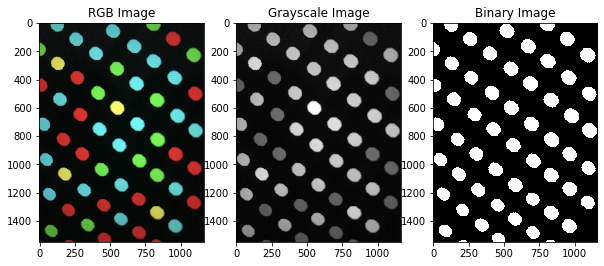

In [20]:
img_path_1 = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/ccp2.png'
c1,n1,p1,cd1 = get_coded_patterns(img_path_1)

In [21]:
#c1,n1,p1,cd1
p1

{(26, 129): 'BGRYBRBBR',
 (0, 383): 'RBBYRBBGB',
 (24, 806): 'GBBGBBRBG',
 (55, 520): 'BRBBBGBBG',
 (112, 944): 'RGBBBBBGR',
 (113, 261): 'BBGYRBGBR',
 (163, 670): 'BRBBGBBRG',
 (186, 20): 'GRYBRBBBR',
 (215, 401): 'BBYRGGBBR',
 (226, 1089): 'GGRBBBGBR',
 (268, 809): 'BBGBGBGRG',
 (284, 131): 'YGRBRGBBB',
 (322, 549): 'GBBRGYBBB',
 (385, 955): 'BBBBGBRGR',
 (385, 269): 'RYRBRGGBB',
 (427, 686): 'BGGYBGBBB',
 (440, 24): 'RBBRGRYBG',
 (493, 415): 'GRBRBYBGB',
 (498, 1100): 'RRBBGBGBG',
 (538, 147): 'BRBRRBGRY',
 (544, 831): 'GBBYBGBRB',
 (599, 550): 'YGRBBBGBG',
 (646, 291): 'RRBBRRBYG',
 (656, 976): 'BBBGBGRBR',
 (713, 692): 'BYBBGGBGB',
 (715, 35): 'BBRYRBRBR',
 (749, 426): 'BRRRGBBYG',
 (759, 1102): 'BBGBBGRRR',
 (823, 836): 'GBBGGRBBG',
 (821, 172): 'RBBBYRGBR',
 (863, 565): 'BBRGBGGBY',
 (924, 304): 'RRBYBGBBR',
 (926, 961): 'RBGGGBRBB',
 (964, 51): 'BBYRBGRRB',
 (973, 706): 'GBGBRGRGB',
 (1024, 1093): 'RBGRGGBRB',
 (1035, 440): 'GRYBRBGBB',
 (1067, 180): 'YBBRBRGRR',
 (1075, 831): 

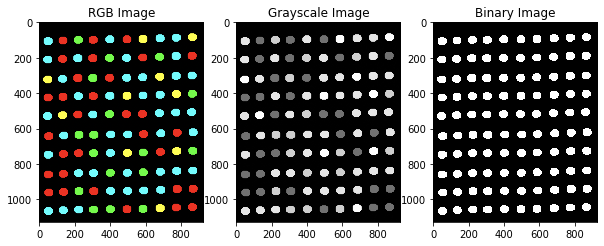

In [22]:
img_path_2 = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/Color-coded-pattern.png'
c2,n2,p2,cd2 = get_coded_patterns(img_path_2)

In [23]:
#c2,n2,p2,cd2
p2

{(85, 862): 'YBBYBGBRB',
 (87, 772): 'BBYGRBBRY',
 (91, 680): 'BYRRGBRBY',
 (95, 584): 'YBRBRGBBB',
 (97, 398): 'BGRBRGBRY',
 (97, 494): 'RBRGBRGYB',
 (99, 220): 'GRBRBRGRB',
 (99, 304): 'RGRBRRGBR',
 (103, 134): 'RBBRBBRGR',
 (107, 50): 'BBYRBBRGR',
 (189, 860): 'RBBBGBBGY',
 (191, 770): 'BBGYBBRYB',
 (195, 678): 'GYRBYBBBB',
 (199, 582): 'RRBBBYGBY',
 (201, 396): 'GRRGRBBRB',
 (201, 492): 'BBGRBBRYR',
 (203, 218): 'BRRBRGRRG',
 (203, 302): 'RGBRGRGBR',
 (207, 132): 'RBBYBRBGR',
 (211, 48): 'BYBRRBRGB',
 (301, 860): 'BBBYYBBGR',
 (303, 770): 'BGYBYGBRB',
 (307, 678): 'YRBBBYBBG',
 (311, 582): 'BBBYBBYGR',
 (313, 396): 'RRGRBYBBG',
 (313, 492): 'BGRBYBBRB',
 (315, 218): 'RRBRBRGRB',
 (315, 302): 'GBRBRBRGR',
 (319, 132): 'BBYRRBRBR',
 (323, 48): 'YBRRBBRRB',
 (403, 862): 'GBYYBBBRB',
 (405, 772): 'YYBBBBGBB',
 (409, 680): 'BBBRBBYBY',
 (413, 584): 'BBYRRBBYB',
 (415, 398): 'BGRBGRYBR',
 (415, 494): 'YRBGRRBBB',
 (417, 220): 'BBRYRBRGR',
 (417, 304): 'RRBRBGBRG',
 (421, 134): 'RYRBYRBRB

# 8 ROTATED PATTERNS FROM A SINGLE PATTERN

In [24]:
def get_rotated_codes(code_dict):  #circular shift
    cd = code_dict.copy() 
    for key,value in cd.items():
        p2 = []
        for j in range(8):
            p2.append(value[0]+r_shift(value[1:],j))
            cd[key] = p2
    
    return cd

# MATCHING SAME POINTS IN TWO CODED PATTERNS DICTIONARIES

In [25]:
def same_points(code_dict1, code_dict2):
    same_patterns = []
    cd1 = get_rotated_codes(code_dict1)
    cd2 = get_rotated_codes(code_dict2)
    
    for key,val in cd1.items():
        cd1[key] = sorted(val)
    for key,val in cd2.items():
        cd2[key] = sorted(val)  
        
    same_patterns = [lst for lst in cd1.values() if lst in cd2.values()]
    print('No. of same 3x3 patterns detected: ',len(same_patterns))
    
    lst1,lst2 = ([],[])
    for val in same_patterns:
        p1 = get_key(val, cd1)
        p2 = get_key(val, cd2)
        
        lst1.append(p1)
        lst2.append(p2)
        
        v = ''.join([color_dict_rgb[int(i)] for i in val[0]])
        print('Pattern: ',v)
        print('Found at ',p1,' in image 1')
        print('Found at ',p2,' in image 2')
   
    return lst1,lst2

In [26]:
lst1, lst2 = same_points(cd1,cd2)

No. of same 3x3 patterns detected:  22
Pattern:  BRGGBBRBY
Found at  (215, 401)  in image 1
Found at  (843, 682)  in image 2
Pattern:  BRGBGBGBG
Found at  (268, 809)  in image 1
Found at  (951, 498)  in image 2
Pattern:  GRGYBBBBB
Found at  (322, 549)  in image 1
Found at  (847, 586)  in image 2
Pattern:  RRGGBBYRB
Found at  (385, 269)  in image 1
Found at  (731, 682)  in image 2
Pattern:  BYBGBBBGG
Found at  (427, 686)  in image 1
Found at  (849, 496)  in image 2
Pattern:  GRBRBYBGB
Found at  (493, 415)  in image 1
Found at  (735, 586)  in image 2
Pattern:  GRBBBYBGB
Found at  (544, 831)  in image 1
Found at  (849, 400)  in image 2
Pattern:  YRBBBGBGG
Found at  (599, 550)  in image 1
Found at  (737, 496)  in image 2
Pattern:  RRRBYGRBB
Found at  (646, 291)  in image 1
Found at  (631, 588)  in image 2
Pattern:  BYBBGGBGB
Found at  (713, 692)  in image 1
Found at  (737, 400)  in image 2
Pattern:  BRRRGBBYG
Found at  (749, 426)  in image 1
Found at  (633, 498)  in image 2
Pattern:  GRBBG

# DRAWING CONNECTIONS BETWEEN SAME POINTS

In [27]:
from matplotlib.patches import ConnectionPatch

def draw_connections(path1,path2,lst1,lst2):

    img1 = Image.open(path1)
    img2 = Image.open(path2)

    fig = plt.figure(figsize=(20,20))

    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(img1)

    ax2 = fig.add_subplot(1,2,2)
    ax2.imshow(img2)


    # Draw an arrow between the same point in data coordinates,
    # but in different axes.

    for i in range(len(lst1)):
        xy = [lst1[i][1],lst1[i][0]]
        x2y2 = [lst2[i][1],lst2[i][0]]
        con = ConnectionPatch(xyA=xy, coordsA=ax1.transData,xyB=x2y2, coordsB=ax2.transData,arrowstyle="<->", shrinkB=5)
        con.set_color('c')
        con.set_linewidth(5)
        fig.add_artist(con)

    plt.show()

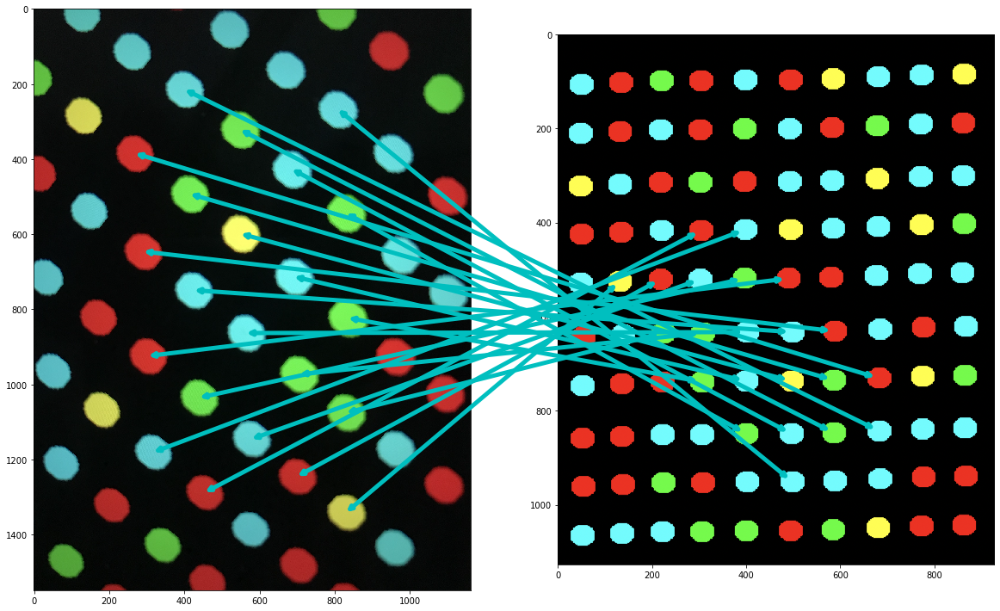

In [28]:
draw_connections(img_path_1,img_path_2,lst1,lst2)

# FINAL FUNCTION TO MATCH POINTS

In [29]:
def match_points(img_path_1,img_path_2, th1=50, th2=50):
    _,_,_,code_dict_1 = get_coded_patterns(img_path_1, th1)
    _,_,_,code_dict_2 = get_coded_patterns(img_path_2, th2) 
    lst1,lst2 = same_points(code_dict_1,code_dict_2)
    draw_connections(img_path_1, img_path_2, lst1, lst2)
    pass

# TEST CASES

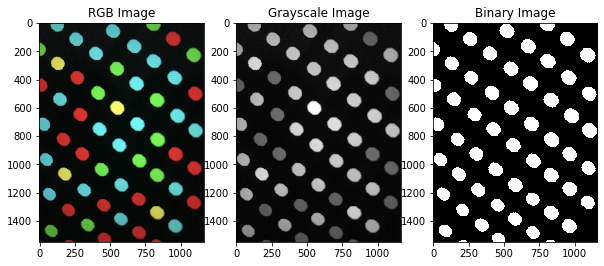

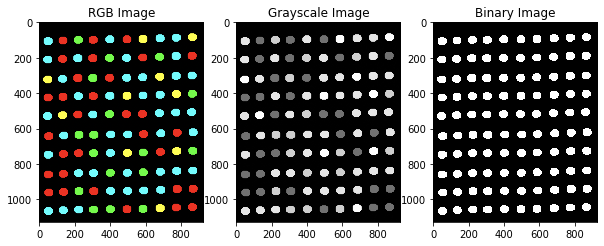

No. of same 3x3 patterns detected:  22
Pattern:  BRGGBBRBY
Found at  (215, 401)  in image 1
Found at  (843, 682)  in image 2
Pattern:  BRGBGBGBG
Found at  (268, 809)  in image 1
Found at  (951, 498)  in image 2
Pattern:  GRGYBBBBB
Found at  (322, 549)  in image 1
Found at  (847, 586)  in image 2
Pattern:  RRGGBBYRB
Found at  (385, 269)  in image 1
Found at  (731, 682)  in image 2
Pattern:  BYBGBBBGG
Found at  (427, 686)  in image 1
Found at  (849, 496)  in image 2
Pattern:  GRBRBYBGB
Found at  (493, 415)  in image 1
Found at  (735, 586)  in image 2
Pattern:  GRBBBYBGB
Found at  (544, 831)  in image 1
Found at  (849, 400)  in image 2
Pattern:  YRBBBGBGG
Found at  (599, 550)  in image 1
Found at  (737, 496)  in image 2
Pattern:  RRRBYGRBB
Found at  (646, 291)  in image 1
Found at  (631, 588)  in image 2
Pattern:  BYBBGGBGB
Found at  (713, 692)  in image 1
Found at  (737, 400)  in image 2
Pattern:  BRRRGBBYG
Found at  (749, 426)  in image 1
Found at  (633, 498)  in image 2
Pattern:  GRBBG

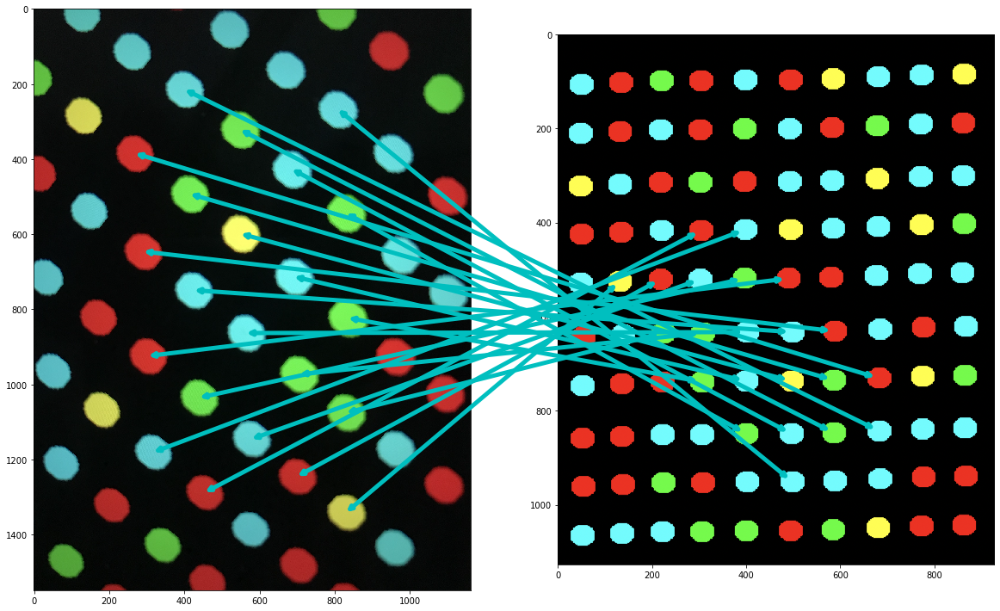

In [30]:
match_points(img_path_1,img_path_2)

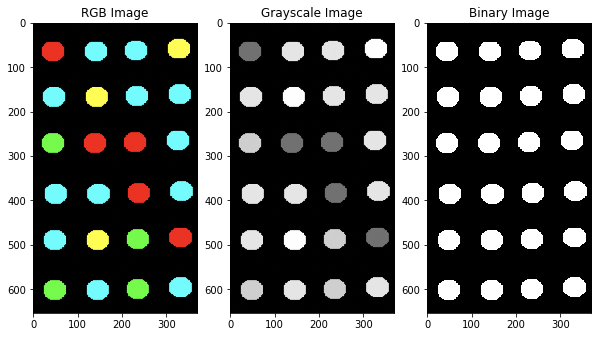

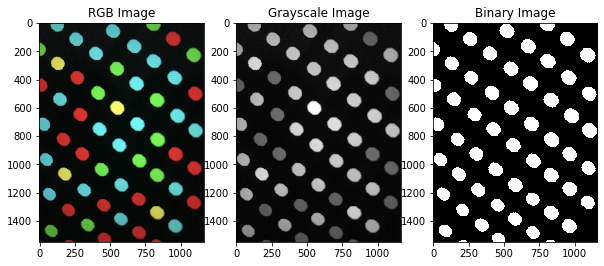

No. of same 3x3 patterns detected:  5
Pattern:  RRRBYBGBB
Found at  (271, 138)  in image 1
Found at  (924, 304)  in image 2
Pattern:  RRRBYGRBB
Found at  (383, 236)  in image 1
Found at  (646, 291)  in image 2
Pattern:  BRRRGBBYG
Found at  (385, 146)  in image 1
Found at  (749, 426)  in image 2
Pattern:  GRBRBYBGB
Found at  (487, 234)  in image 1
Found at  (493, 415)  in image 2
Pattern:  YRBBBGBGG
Found at  (489, 144)  in image 1
Found at  (599, 550)  in image 2


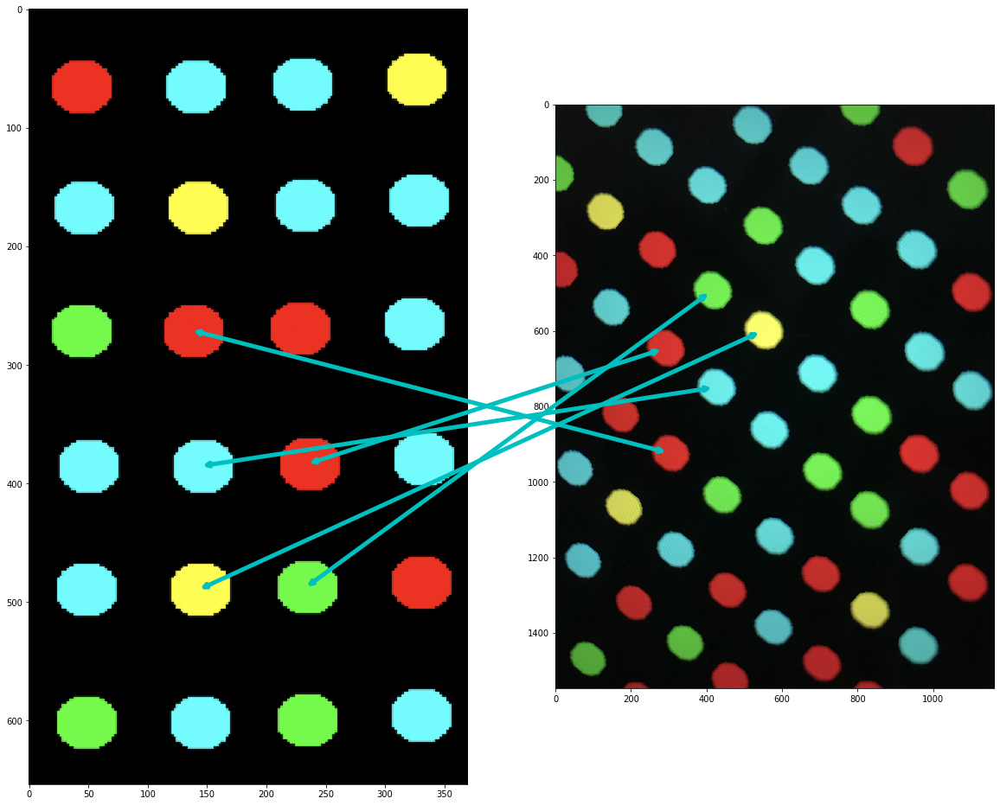

In [31]:
img_path_3 = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/(5X5)90.png'
img_path_4 = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/(5X5)2.png'
match_points(img_path_3,img_path_1)

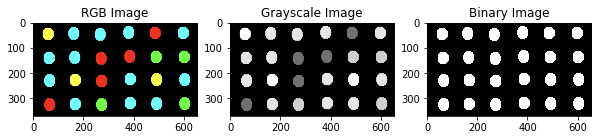

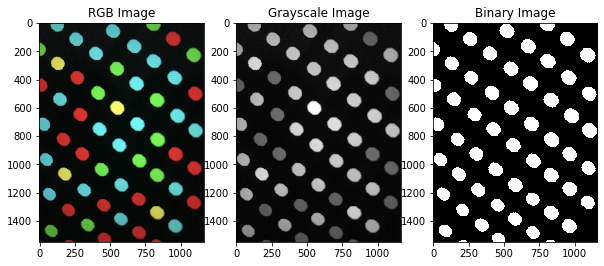

No. of same 3x3 patterns detected:  5
Pattern:  RRRBYGRBB
Found at  (132, 383)  in image 1
Found at  (646, 291)  in image 2
Pattern:  GRBRBYBGB
Found at  (134, 487)  in image 1
Found at  (493, 415)  in image 2
Pattern:  BRRRGBBYG
Found at  (222, 385)  in image 1
Found at  (749, 426)  in image 2
Pattern:  YRBBBGBGG
Found at  (224, 489)  in image 1
Found at  (599, 550)  in image 2
Pattern:  RRRBYBGBB
Found at  (230, 271)  in image 1
Found at  (924, 304)  in image 2


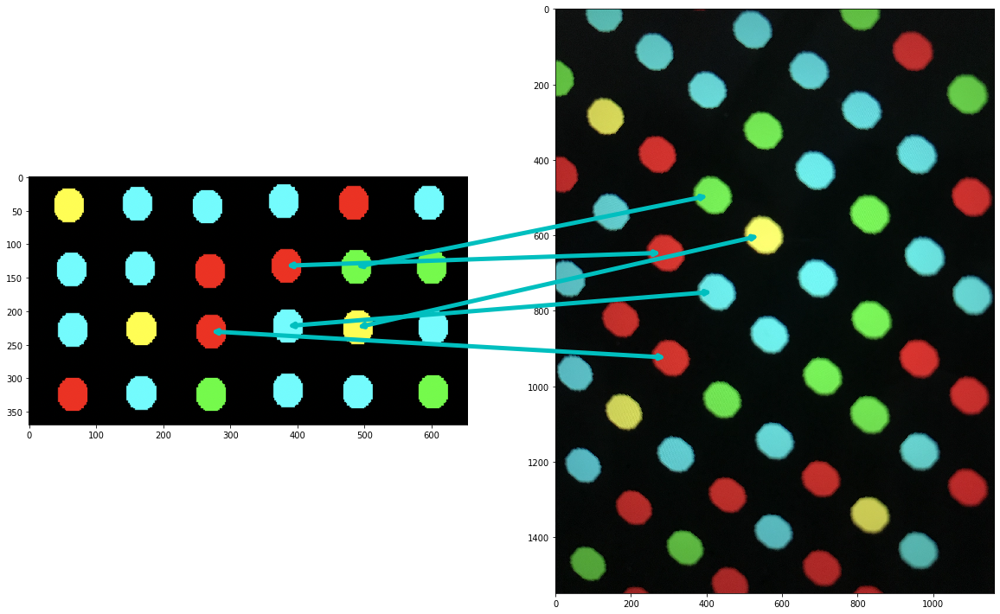

In [32]:
match_points(img_path_4, img_path_1)

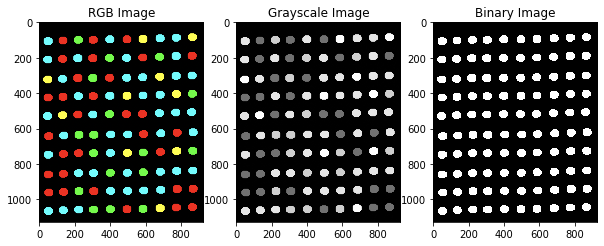

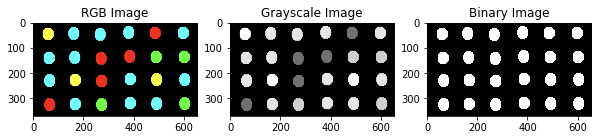

No. of same 3x3 patterns detected:  9
Pattern:  BRRBBYBBY
Found at  (413, 584)  in image 1
Found at  (136, 165)  in image 2
Pattern:  YRRBBBRBG
Found at  (415, 494)  in image 1
Found at  (226, 167)  in image 2
Pattern:  RRBRBBBBY
Found at  (517, 580)  in image 1
Found at  (140, 269)  in image 2
Pattern:  RRRBYBGBB
Found at  (519, 490)  in image 1
Found at  (230, 271)  in image 2
Pattern:  RRRBYGRBB
Found at  (631, 588)  in image 1
Found at  (132, 383)  in image 2
Pattern:  BRRRGBBYG
Found at  (633, 498)  in image 1
Found at  (222, 385)  in image 2
Pattern:  GRBRBYBGB
Found at  (735, 586)  in image 1
Found at  (134, 487)  in image 2
Pattern:  YRBBBGBGG
Found at  (737, 496)  in image 1
Found at  (224, 489)  in image 2
Pattern:  BRRBGYRBB
Found at  (839, 774)  in image 1
Found at  (36, 379)  in image 2


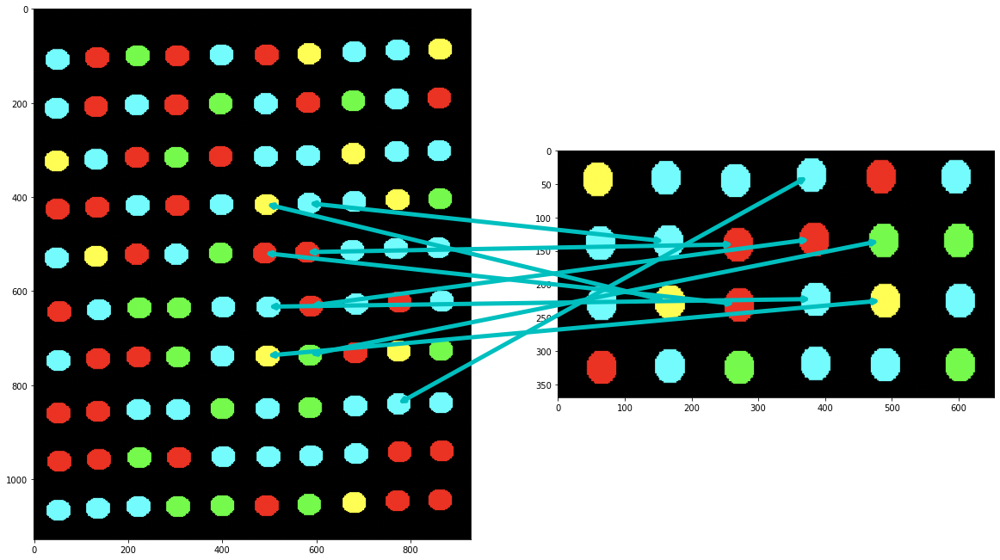

In [33]:
match_points(img_path_2,img_path_4)

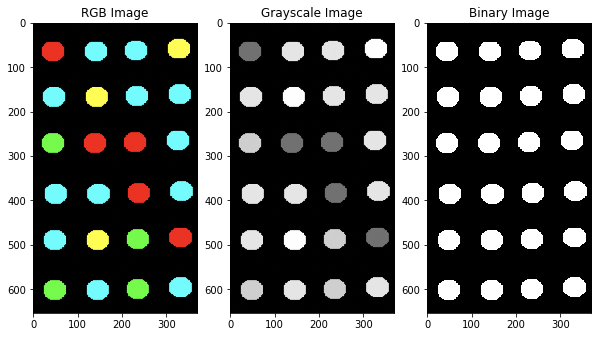

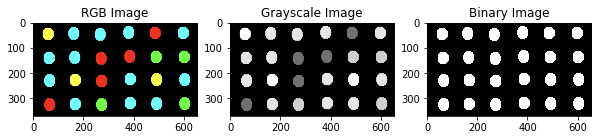

No. of same 3x3 patterns detected:  16
Pattern:  RRYRBBBGB
Found at  (65, 44)  in image 1
Found at  (324, 65)  in image 2
Pattern:  BRYBBBYRB
Found at  (65, 140)  in image 1
Found at  (228, 65)  in image 2
Pattern:  BRBBYBBBY
Found at  (161, 328)  in image 1
Found at  (40, 161)  in image 2
Pattern:  BRRBBYBBY
Found at  (165, 232)  in image 1
Found at  (136, 165)  in image 2
Pattern:  BRRYBBBRG
Found at  (167, 46)  in image 1
Found at  (322, 167)  in image 2
Pattern:  YRRBBBRBG
Found at  (167, 142)  in image 1
Found at  (226, 167)  in image 2
Pattern:  BRRRBBYBY
Found at  (265, 324)  in image 1
Found at  (44, 265)  in image 2
Pattern:  RRBRBBBBY
Found at  (269, 228)  in image 1
Found at  (140, 269)  in image 2
Pattern:  RRRBYBGBB
Found at  (271, 138)  in image 1
Found at  (230, 271)  in image 2
Pattern:  BRRBGYRBB
Found at  (379, 332)  in image 1
Found at  (36, 379)  in image 2
Pattern:  RRRBYGRBB
Found at  (383, 236)  in image 1
Found at  (132, 383)  in image 2
Pattern:  BRRRGBYGB
Foun

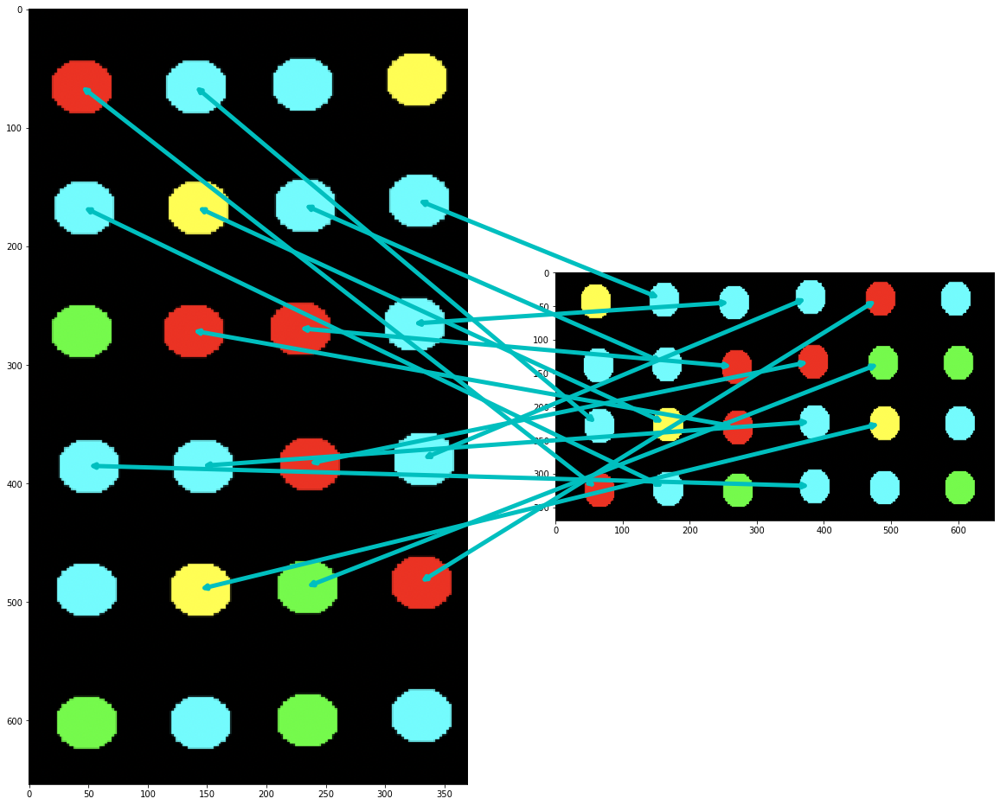

In [34]:
match_points(img_path_3,img_path_4)

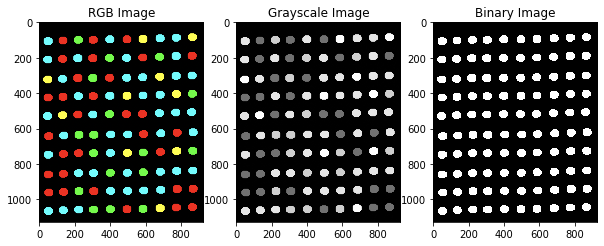

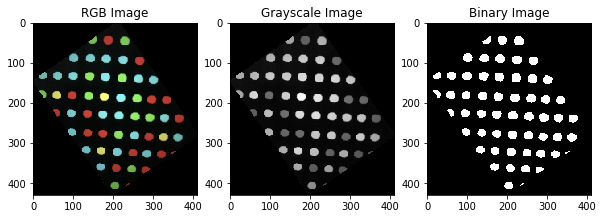

No. of same 3x3 patterns detected:  22
Pattern:  BRRBRBRBY
Found at  (319, 132)  in image 1
Found at  (273, 96)  in image 2
Pattern:  BRYBRGRBG
Found at  (415, 398)  in image 1
Found at  (322, 208)  in image 2
Pattern:  RRGRBRBGB
Found at  (417, 304)  in image 1
Found at  (324, 247)  in image 2
Pattern:  GRYBRBGBB
Found at  (519, 396)  in image 1
Found at  (279, 212)  in image 2
Pattern:  RRRBYBGBB
Found at  (519, 490)  in image 1
Found at  (277, 172)  in image 2
Pattern:  RRYBGGBRB
Found at  (521, 218)  in image 1
Found at  (285, 287)  in image 2
Pattern:  BRGGBGBRB
Found at  (521, 302)  in image 1
Found at  (281, 252)  in image 2
Pattern:  YRRBRBGRB
Found at  (525, 132)  in image 1
Found at  (285, 324)  in image 2
Pattern:  RRRBYGRBB
Found at  (631, 588)  in image 1
Found at  (227, 134)  in image 2
Pattern:  BRGBGGBYB
Found at  (633, 402)  in image 1
Found at  (231, 213)  in image 2
Pattern:  BRRRGBBYG
Found at  (633, 498)  in image 1
Found at  (229, 172)  in image 2
Pattern:  GRRGGB

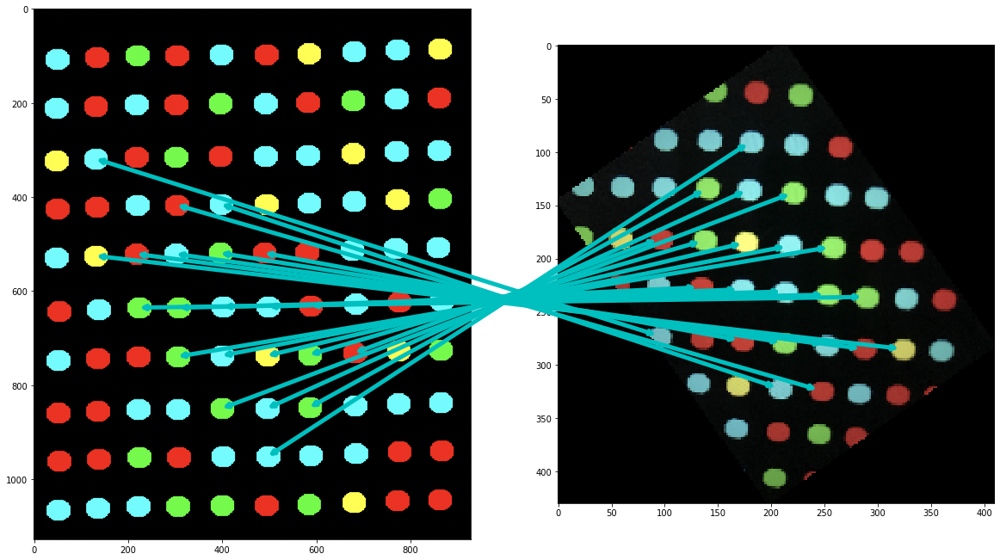

In [35]:
img_path_5 = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/rot.png'
match_points(img_path_2, img_path_5)

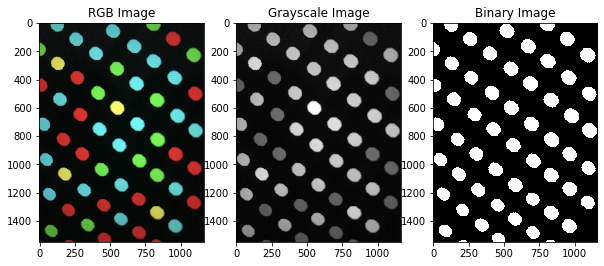

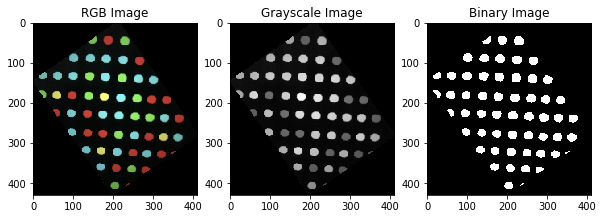

No. of same 3x3 patterns detected:  28
Pattern:  BRGBGBGBG
Found at  (268, 809)  in image 1
Found at  (90, 181)  in image 2
Pattern:  GRGYBBBBB
Found at  (322, 549)  in image 1
Found at  (134, 140)  in image 2
Pattern:  BRGRBBBGB
Found at  (385, 955)  in image 1
Found at  (93, 223)  in image 2
Pattern:  RRGGBBYRB
Found at  (385, 269)  in image 1
Found at  (181, 96)  in image 2
Pattern:  BYBGBBBGG
Found at  (427, 686)  in image 1
Found at  (135, 179)  in image 2
Pattern:  GRBRBYBGB
Found at  (493, 415)  in image 1
Found at  (183, 137)  in image 2
Pattern:  GRBBBYBGB
Found at  (544, 831)  in image 1
Found at  (138, 221)  in image 2
Pattern:  YRBBBGBGG
Found at  (599, 550)  in image 1
Found at  (185, 176)  in image 2
Pattern:  RRRBYGRBB
Found at  (646, 291)  in image 1
Found at  (227, 134)  in image 2
Pattern:  BRBRBBGBG
Found at  (656, 976)  in image 1
Found at  (140, 262)  in image 2
Pattern:  BYBBGGBGB
Found at  (713, 692)  in image 1
Found at  (188, 217)  in image 2
Pattern:  BRRRGBBY

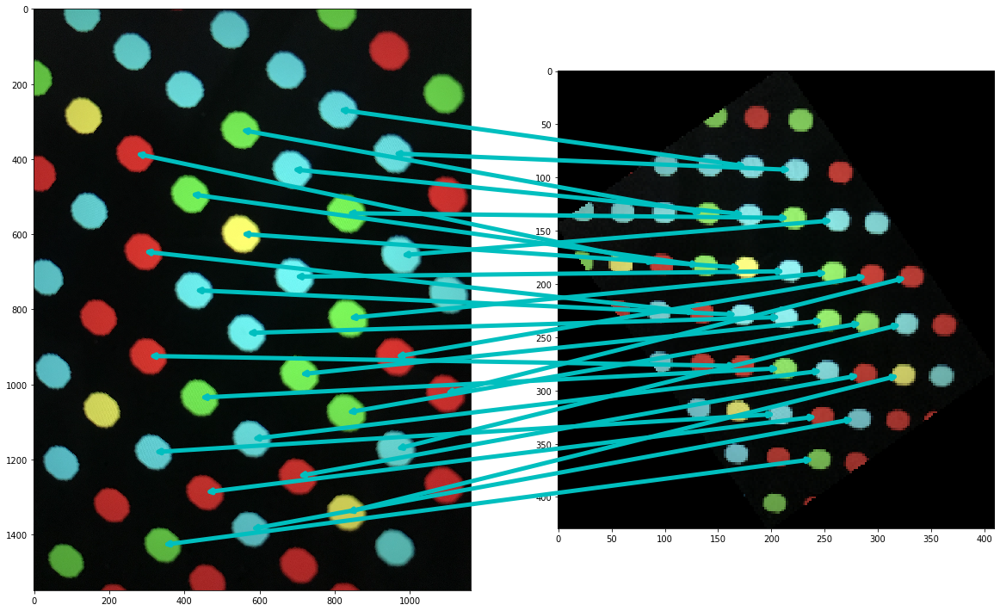

In [36]:
match_points(img_path_1,img_path_5)

In [37]:
path = '/Users/hassaanmuzammil/Desktop/GBMC/train_pics/'
img_path_6 = path + 'train1.jpg'
img_path_7 = path + 'train2.jpg'
img_path_8 = path + 'train3.png'
#img_path_9 = path + 'train4.jpg'

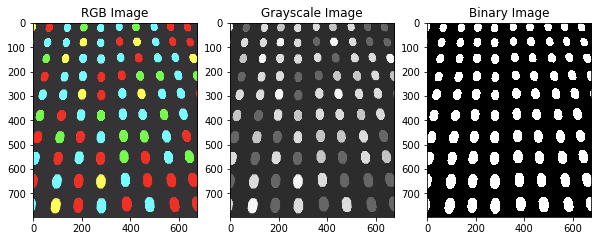

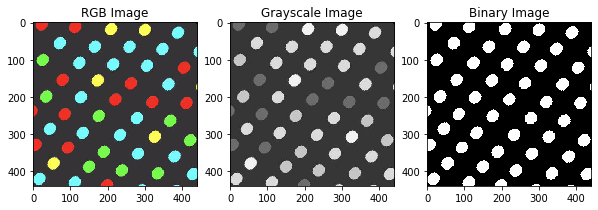

No. of same 3x3 patterns detected:  14
Pattern:  BRRBGYRBB
Found at  (76, 501)  in image 1
Found at  (419, 16)  in image 2
Pattern:  BRRGRYRBB
Found at  (141, 358)  in image 1
Found at  (166, 361)  in image 2
Pattern:  BRRBRBYBB
Found at  (147, 277)  in image 1
Found at  (116, 304)  in image 2
Pattern:  RRRBYGRBB
Found at  (215, 362)  in image 1
Found at  (213, 318)  in image 2
Pattern:  BRRBBYBBY
Found at  (218, 203)  in image 1
Found at  (112, 214)  in image 2
Pattern:  YRBBBGBGG
Found at  (290, 443)  in image 1
Found at  (306, 325)  in image 2
Pattern:  BYBGBBBGG
Found at  (290, 528)  in image 1
Found at  (359, 378)  in image 2
Pattern:  BRBYBBRBG
Found at  (294, 123)  in image 1
Found at  (109, 123)  in image 2
Pattern:  BYBBGGBGB
Found at  (375, 448)  in image 1
Found at  (351, 280)  in image 2
Pattern:  BRYBRGRBG
Found at  (377, 196)  in image 1
Found at  (201, 127)  in image 2
Pattern:  GRGRGBBGB
Found at  (463, 369)  in image 1
Found at  (347, 188)  in image 2
Pattern:  RRGRBRB

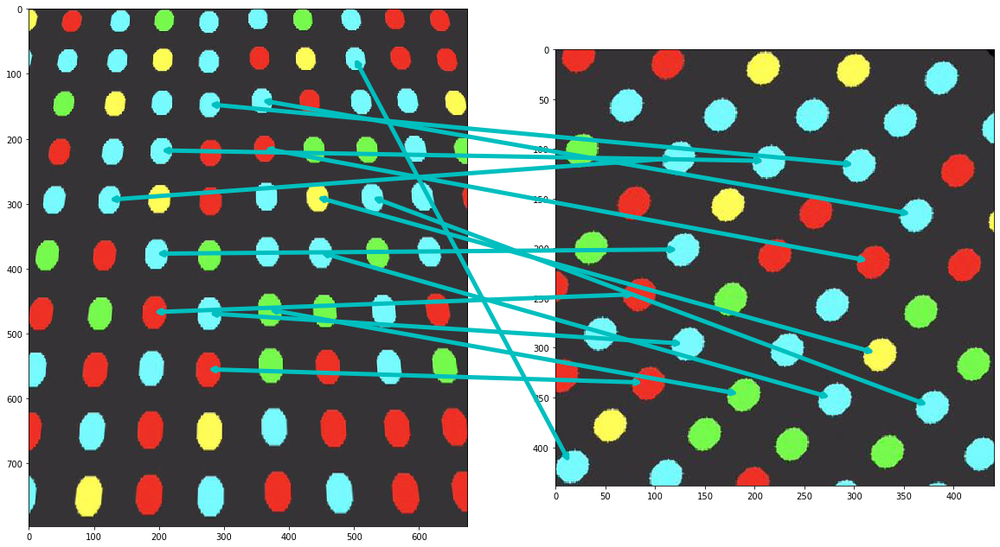

In [38]:
match_points(img_path_6,img_path_7,th1=80, th2=80)  #th=80 in read_display

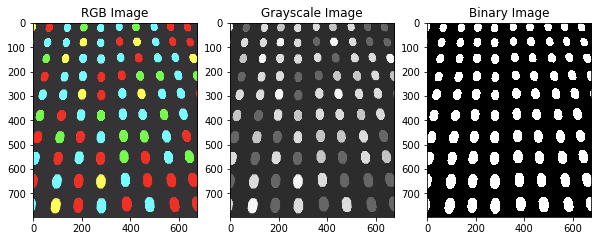

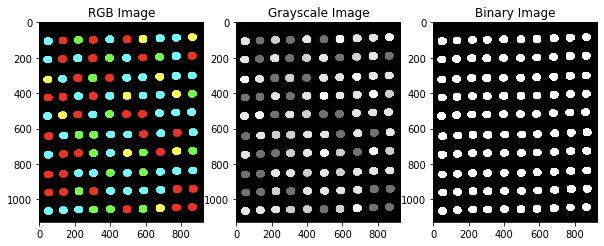

No. of same 3x3 patterns detected:  56
Pattern:  GRBRBYRBB
Found at  (16, 420)  in image 1
Found at  (725, 864)  in image 2
Pattern:  RRRGBBBRB
Found at  (15, 562)  in image 1
Found at  (939, 866)  in image 2
Pattern:  RRYGBBBBB
Found at  (75, 354)  in image 1
Found at  (623, 776)  in image 2
Pattern:  YRBRBBBGB
Found at  (76, 425)  in image 1
Found at  (727, 774)  in image 2
Pattern:  BRRBGYRBB
Found at  (76, 501)  in image 1
Found at  (839, 774)  in image 2
Pattern:  RRRRBBBBY
Found at  (75, 570)  in image 1
Found at  (941, 776)  in image 2
Pattern:  YYBBBBGBB
Found at  (78, 205)  in image 1
Found at  (405, 772)  in image 2
Pattern:  RRRRBBBYG
Found at  (78, 642)  in image 1
Found at  (1045, 772)  in image 2
Pattern:  BRBGYBYGB
Found at  (79, 135)  in image 1
Found at  (303, 770)  in image 2
Pattern:  BRBBGYBBB
Found at  (80, 276)  in image 1
Found at  (509, 768)  in image 2
Pattern:  BRRGRYRBB
Found at  (141, 358)  in image 1
Found at  (627, 684)  in image 2
Pattern:  BRRBBGBGY
Foun

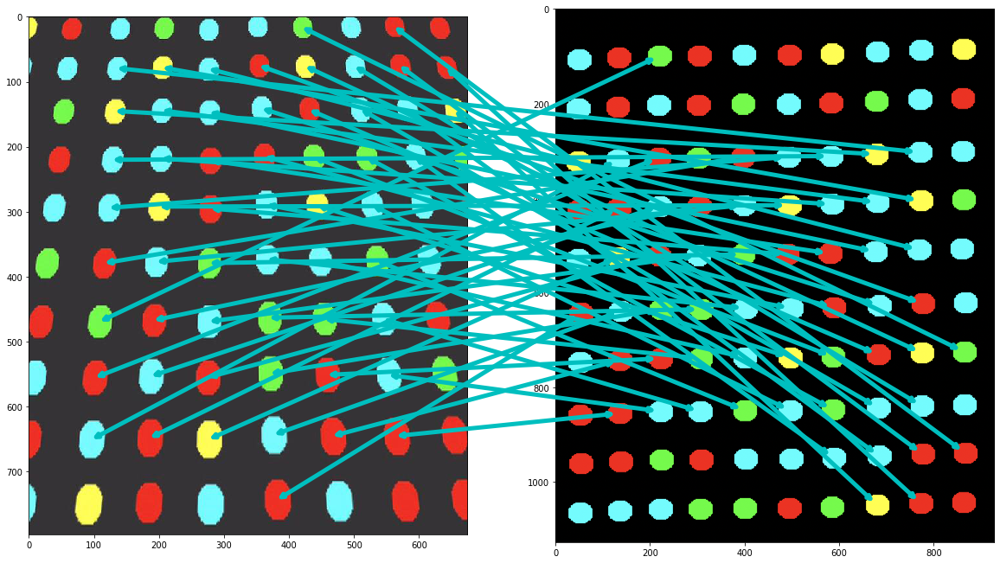

In [39]:
match_points(img_path_6,img_path_2, th1=80, th2=80) #th=80 in read_display

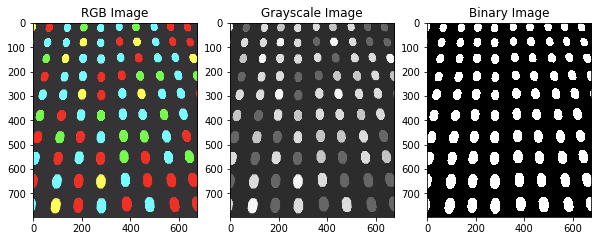

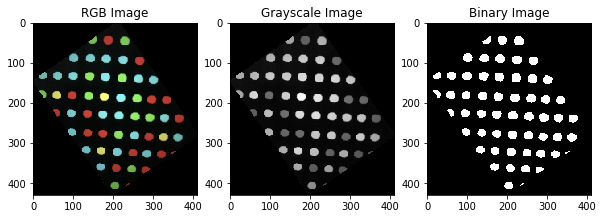

No. of same 3x3 patterns detected:  21
Pattern:  RRGGBBYRB
Found at  (143, 431)  in image 1
Found at  (181, 96)  in image 2
Pattern:  RRRBYGRBB
Found at  (215, 362)  in image 1
Found at  (227, 134)  in image 2
Pattern:  GRBRBYBGB
Found at  (216, 438)  in image 1
Found at  (183, 137)  in image 2
Pattern:  GRGYBBBBB
Found at  (216, 519)  in image 1
Found at  (134, 140)  in image 2
Pattern:  BRRRGBBYG
Found at  (289, 365)  in image 1
Found at  (229, 172)  in image 2
Pattern:  YRBBBGBGG
Found at  (290, 443)  in image 1
Found at  (185, 176)  in image 2
Pattern:  BYBGBBBGG
Found at  (290, 528)  in image 1
Found at  (135, 179)  in image 2
Pattern:  RRRBYBGBB
Found at  (295, 279)  in image 1
Found at  (277, 172)  in image 2
Pattern:  BRGBGGBYB
Found at  (373, 366)  in image 1
Found at  (231, 213)  in image 2
Pattern:  BYBBGGBGB
Found at  (375, 448)  in image 1
Found at  (188, 217)  in image 2
Pattern:  GRBBBYBGB
Found at  (375, 535)  in image 1
Found at  (138, 221)  in image 2
Pattern:  BRYBRG

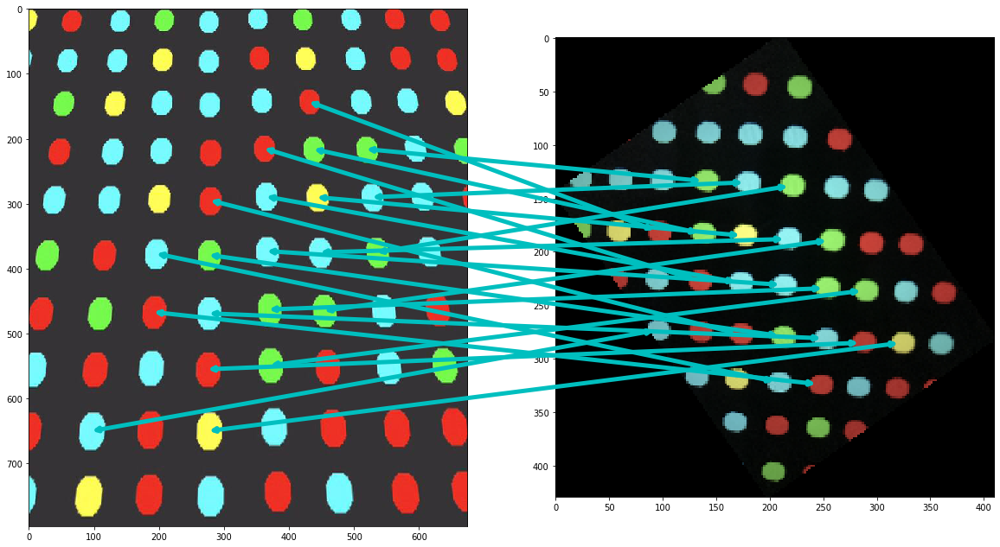

In [40]:
match_points(img_path_6,img_path_5, th1=80) 

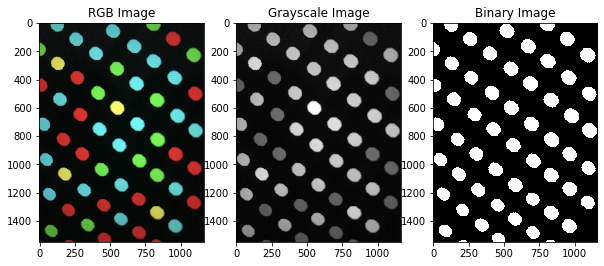

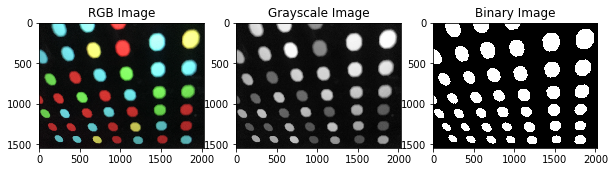

No. of same 3x3 patterns detected:  5
Pattern:  RRRBYBGBB
Found at  (924, 304)  in image 1
Found at  (321, 1029)  in image 2
Pattern:  RRGGBRBBG
Found at  (1024, 1093)  in image 1
Found at  (1273, 1807)  in image 2
Pattern:  BRRGBYRBG
Found at  (1209, 72)  in image 1
Found at  (1444, 1806)  in image 2
Pattern:  RRRBYBGRG
Found at  (1320, 208)  in image 1
Found at  (679, 444)  in image 2
Pattern:  YRRBRBGRB
Found at  (1340, 831)  in image 1
Found at  (1288, 1184)  in image 2


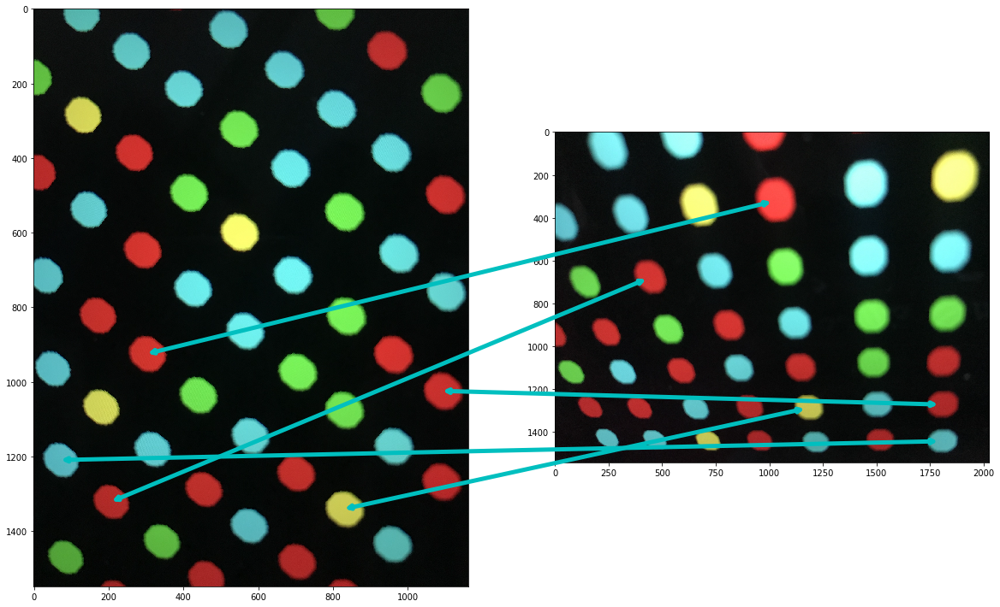

In [41]:
match_points(img_path_1,img_path_8)